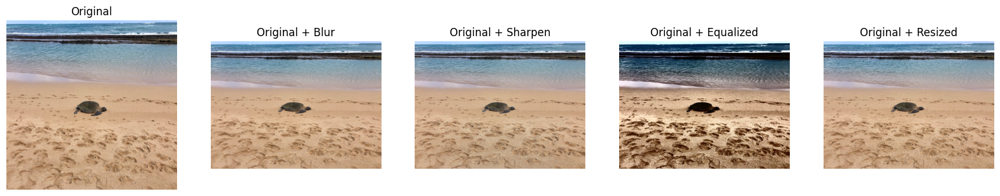

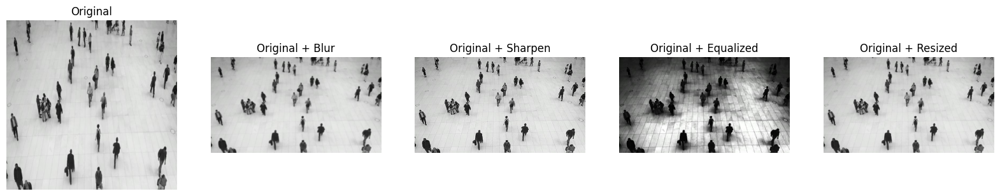

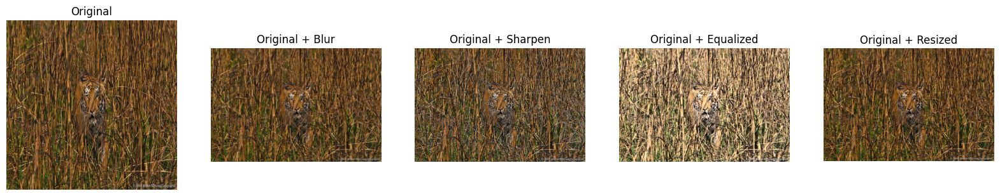

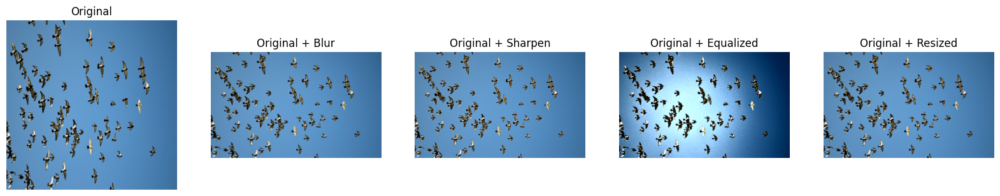

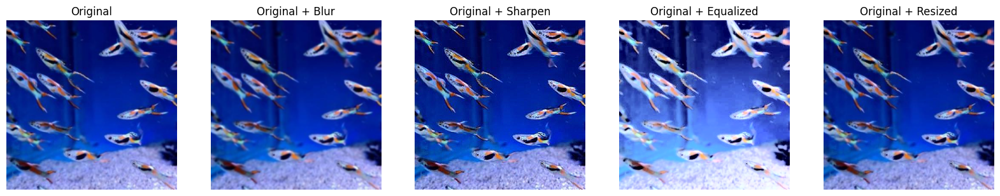

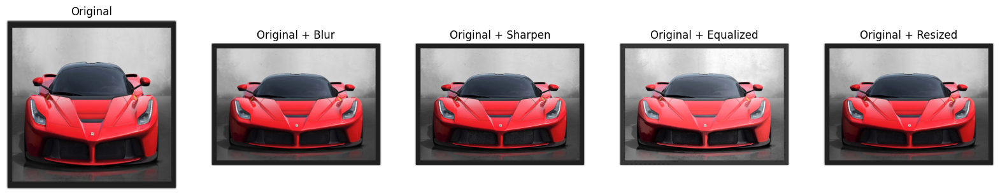

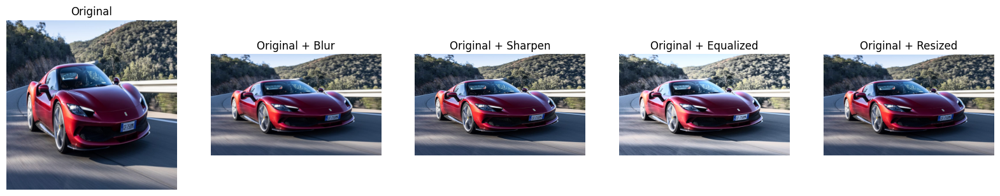

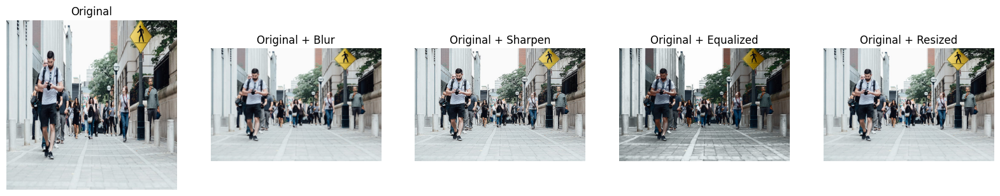

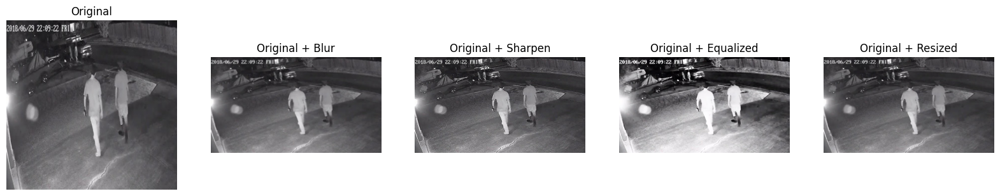

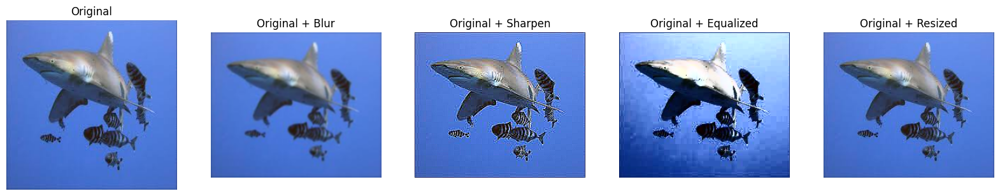

In [2]:
import os
import cv2
import numpy as np
import glob
import matplotlib.pyplot as plt
import requests



# https://docs.google.com/document/d/1gQLO6Oqdu946d8UxUrOiLerWwPb5aIcxf1LLheFv_Vc/edit?tab=t.0 - Recorte
# https://docs.google.com/document/d/1gci9PsEcC1jS_--6-EOZHHS0kuyW3mqSovVdQ3AffcM/edit?tab=t.0#heading=h.pgb897q60pw - Filtros, histrograma, etc

if not os.path.exists("imagens"):
    os.makedirs("imagens")

url = "https://raw.githubusercontent.com/Alewahl12/TrabalhoVisCompA1/main/imagens/"
filenames = ["1.jpg", "6387-191695740_tiny.jpg", "901526d2-543a-42a3-8e01-82ef0e40a9d4.jpg", "HD-wallpaper-people-walking-at-walkway.jpg", 
             "bird-flock-flying-1080x675.jpg", "endlier-guppy-min-300x300-400x400.jpg", 
             "hq720.jpg", "images.jpg", "night-fox_1024.jpg", "pexels-sherissa-r-704096.jpg"]

for filename in filenames:
    filepath = os.path.join("imagens", filename)
    if not os.path.exists(filepath):
        r = requests.get(url + filename)
        if r.status_code == 200:
            with open(filepath, "wb") as f:
                f.write(r.content)
        else:
            print(f"Erro ao baixar {filename}")

caminho = glob.glob('imagens/*.jpg')[:10]
imagens = [cv2.imread(p) for p in caminho]


def processar_imagens(img, novo_tamanho=(512,512)):
    resultados = {}
    #Gaussian Blur aplicado sobre a imagem original
    resultados['blur'] = cv2.GaussianBlur(img, (5, 5), 0)

    #matriz do sharpen e aplicacao do filtro
    kernel = np.array([[0, -1, 0],
                       [-1, 5, -1],
                       [0, -1, 0]])
    resultados['sharpen'] = cv2.filter2D(img, -1, kernel)

    #histograma aplicado na imagem original
    ycrcb = cv2.cvtColor(img, cv2.COLOR_BGR2YUV)
    ycrcb[:,:,0] = cv2.equalizeHist(ycrcb[:,:,0])
    resultados['equalized'] = cv2.cvtColor(ycrcb, cv2.COLOR_YUV2BGR)

    # Redimensionamento aplicado sobre a imagem original
    h, w = img.shape[:2]
    max_h, max_w = novo_tamanho
    scale = min(max_w / w, max_h / h)
    if scale < 1:
        new_w = int(w * scale)
        new_h = int(h * scale)
        resultados['resized'] = cv2.resize(img, (new_w, new_h))
    else:
        resultados['resized'] = img.copy()
    
    return resultados

imagens_processadas = [processar_imagens(img) for img in imagens]

for orig, proc in zip(imagens, imagens_processadas):
    # Redimensiona a imagem original para exibição consistente
    orig_resized = cv2.resize(orig, (512,512), interpolation=cv2.INTER_AREA)
    
    # Exibe a imagem original e as variações obtidas com os filtros aplicados individualmente
    fig, axs = plt.subplots(1, 5, figsize=(20,5))
    axs[0].imshow(cv2.cvtColor(orig_resized, cv2.COLOR_BGR2RGB))
    axs[0].set_title("Original")
    axs[0].axis('off')
    
    axs[1].imshow(cv2.cvtColor(proc['blur'], cv2.COLOR_BGR2RGB))
    axs[1].set_title("Original + Blur")
    axs[1].axis('off')
    
    axs[2].imshow(cv2.cvtColor(proc['sharpen'], cv2.COLOR_BGR2RGB))
    axs[2].set_title("Original + Sharpen")
    axs[2].axis('off')
    
    axs[3].imshow(cv2.cvtColor(proc['equalized'], cv2.COLOR_BGR2RGB))
    axs[3].set_title("Original + Equalized")
    axs[3].axis('off')
    
    axs[4].imshow(cv2.cvtColor(proc['resized'], cv2.COLOR_BGR2RGB))
    axs[4].set_title("Original + Resized")
    axs[4].axis('off')
    
    plt.show()

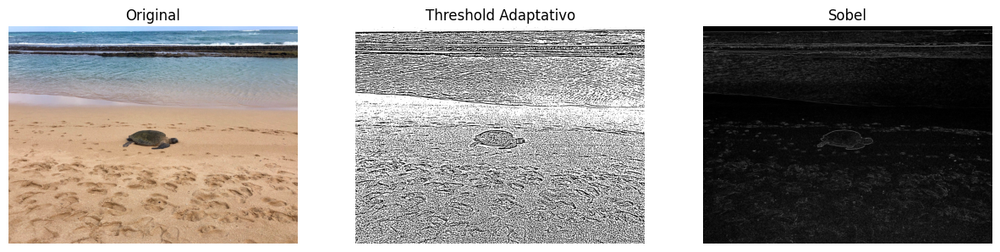

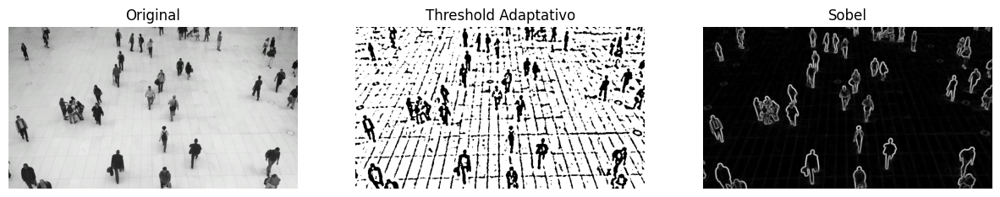

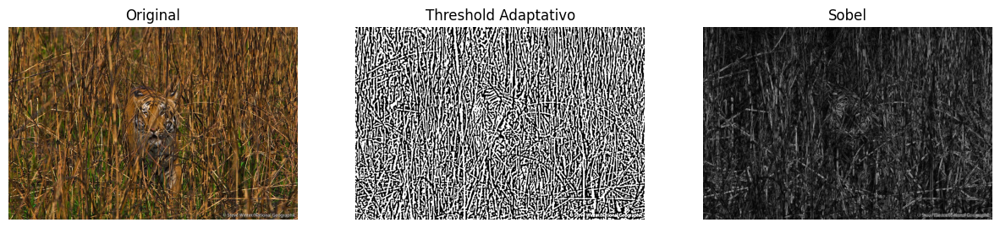

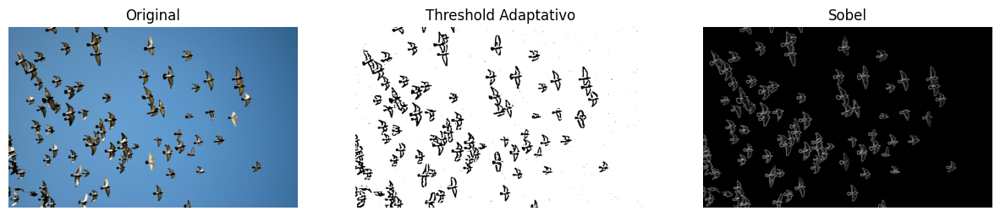

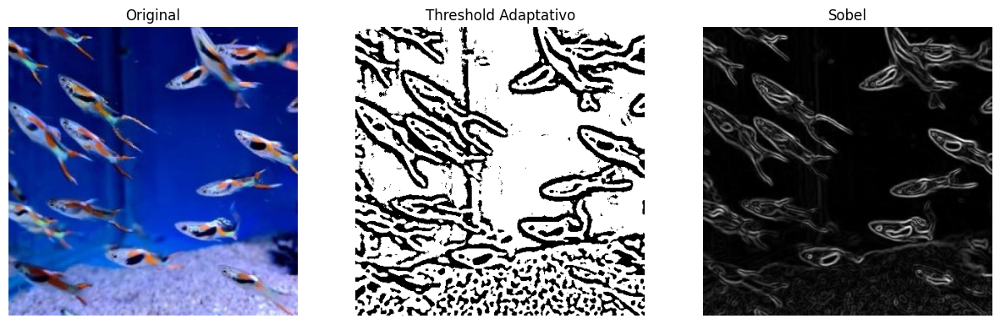

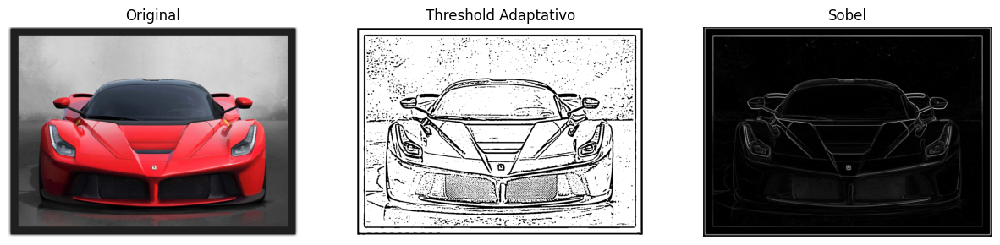

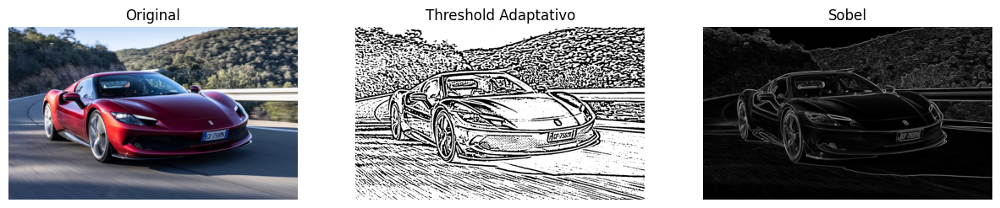

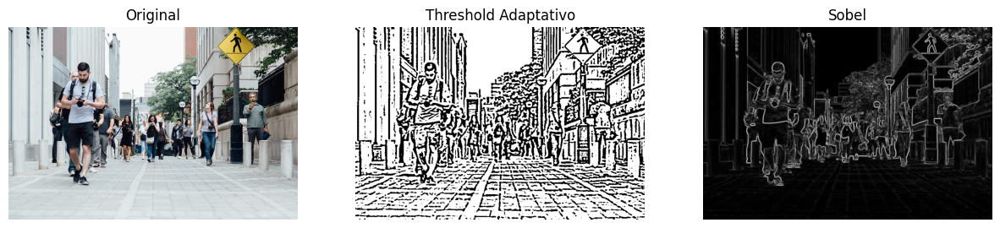

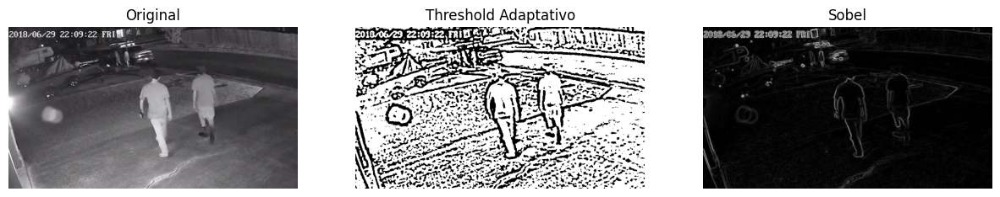

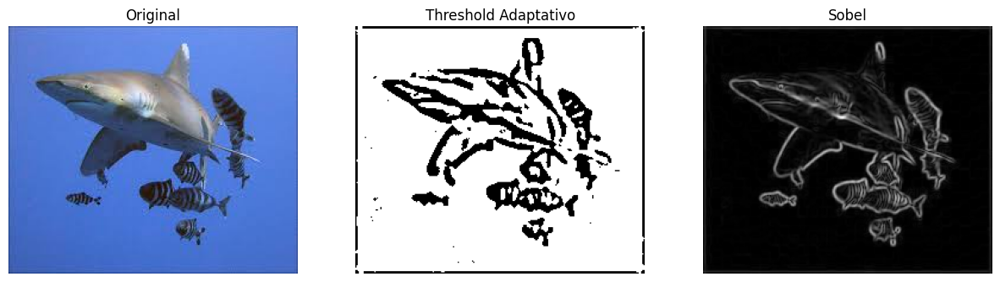

In [3]:
def threshold_mean(image, block_size = 11, C = 2):
    """
    Aplica thresholding adaptativo usando a média local.

    Parâmetros:
        image_path (str): Caminho para o arquivo de imagem.
        block_size (int): Tamanho do bloco de pixels (ímpar) usado para calcular a média local.
        C (int): Constante subtraída da média calculada.

    Retorna:
        thresh_img (np.ndarray): Imagem binarizada pelo método da média local.
    """


    return cv2.adaptiveThreshold(
        image, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, block_size, C
    )

def apply_sobel(imagem, dx=1, dy=0, ksize=3):
    """
    Aplica o filtro de Sobel para detecção de bordas.

    Parâmetros:
        imagem: imagem.
        dx (int): Ordem da derivada em x (1 para detectar bordas horizontais).
        dy (int): Ordem da derivada em y (1 para detectar bordas verticais).
        ksize (int): Tamanho do kernel do filtro Sobel (deve ser ímpar).

    Retorna:
        sobelx (np.ndarray): Resultado do filtro Sobel na direção x.
        sobely (np.ndarray): Resultado do filtro Sobel na direção y.
        sobel_magnitude (np.ndarray): Magnitude combinada das bordas.
    """

    sobelx = cv2.Sobel(imagem, cv2.CV_64F, dx, 0, ksize=ksize)
    sobely = cv2.Sobel(imagem, cv2.CV_64F, 0, dy, ksize=ksize)
    sobel_magnitude = cv2.magnitude(sobelx, sobely)
    
    return sobelx, sobely, sobel_magnitude

for orig, proc in zip(imagens, imagens_processadas):

    orig_gray = cv2.cvtColor(orig, cv2.COLOR_BGR2GRAY)
    gray_com_blur = cv2.GaussianBlur(orig_gray, (5,5), sigmaX=1.5)
    
    #https://docs.google.com/document/d/1gQLO6Oqdu946d8UxUrOiLerWwPb5aIcxf1LLheFv_Vc/edit?tab=t.0
    imagem_adaptativa = threshold_mean(gray_com_blur, 11, 2)
    
    # Utilizamos Sobel pois ele é um algorítimo mais rápido comparado ao canny e tambem nao polui imagens que possuem-
    # muitos detalhes
    #https://docs.google.com/document/d/1FVrFHxNbEwMUu1-66BUFR-F4C6gjMVomAVYY4ZPmUUQ/edit?tab=t.0#heading=h.1kwg48g5mal5 - Sobel, prewitt, canny..
    # Aplicação do filtro Sobel
    sobelx, sobely, sobel_magnitude = apply_sobel(orig_gray, dx=1, dy=1, ksize=5)
    sobel = np.uint8(255 * sobel_magnitude / np.max(sobel_magnitude))
    
    # Exibição dos resultados
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(cv2.cvtColor(orig, cv2.COLOR_BGR2RGB))
    plt.title('Original')
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(imagem_adaptativa, cmap='gray')
    plt.title('Threshold Adaptativo')
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(sobel, cmap='gray')
    plt.title('Sobel')
    plt.axis('off')
    
plt.show()

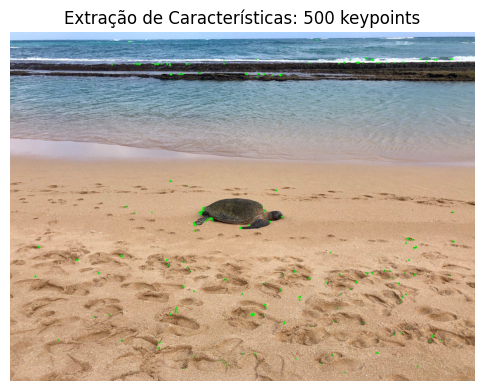

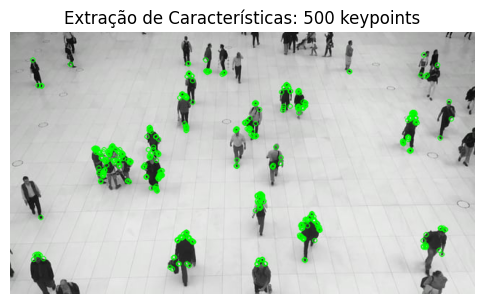

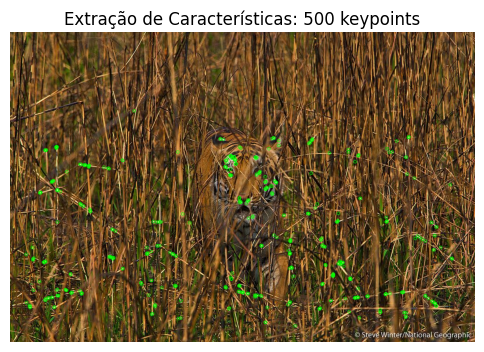

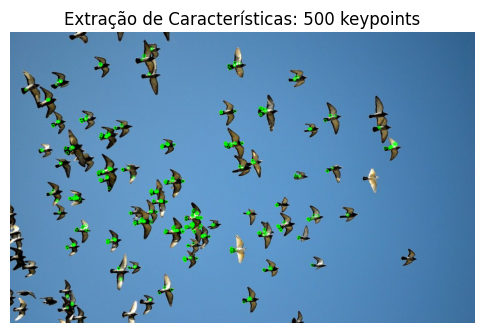

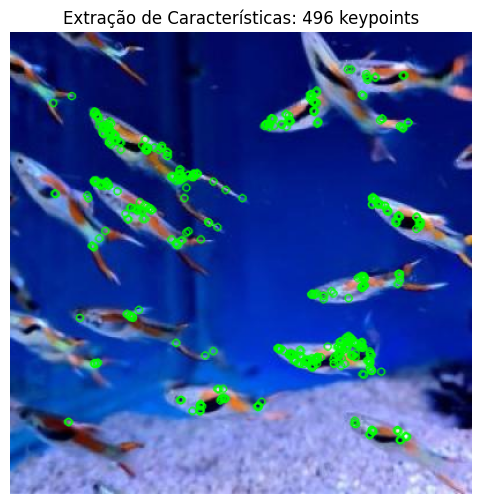

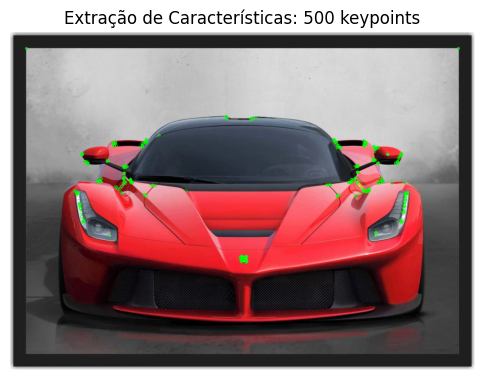

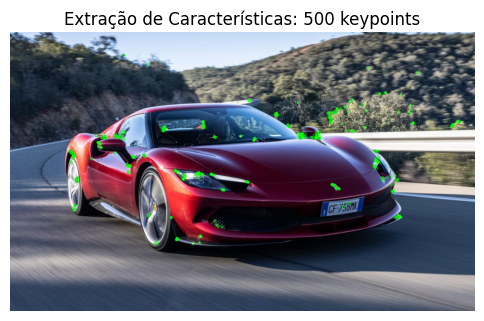

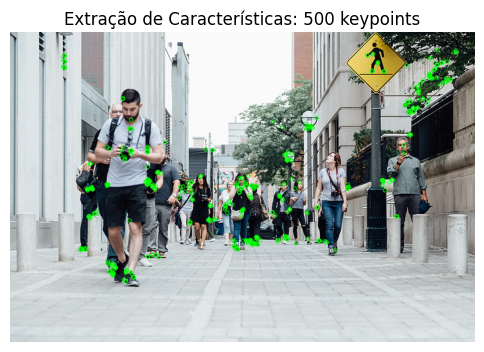

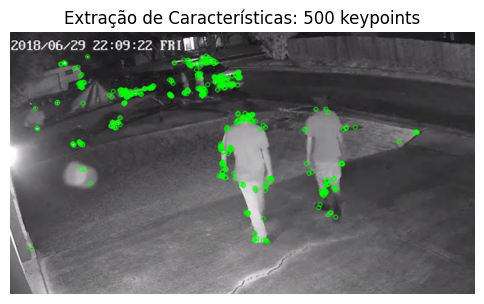

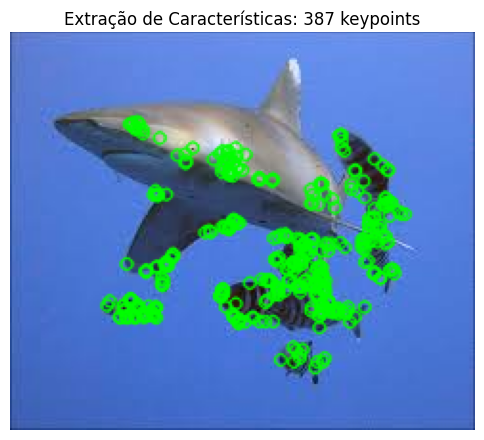

In [4]:
#https://docs.google.com/document/d/12rqF-CXDxADg43MtCsVRS6kkeO5zXlaxz5pPMvuUQs4/edit?tab=t.0#heading=h.w9m0b72nf1q9 - SIFT e ORB
orb = cv2.ORB_create()

for orig in imagens:
    #precisa converter a imagem em escala de cinza
    orig_gray = cv2.cvtColor(orig, cv2.COLOR_BGR2GRAY)
    
    keypoints, descriptors = orb.detectAndCompute(orig_gray, None)
    
    #pontos chave na imagem
    img_keypoints = cv2.drawKeypoints(orig, keypoints, None, color=(0,255,0), flags=0)
    
    plt.figure(figsize=(6,6))
    plt.imshow(cv2.cvtColor(img_keypoints, cv2.COLOR_BGR2RGB))
    plt.title(f"Extração de Características: {len(keypoints)} keypoints")
    plt.axis('off')
    
plt.show()

# Pensar mais tarde, como as caracteristicas extraidas podem ser usados para comparar ou classificar imagens?

# Os descritores obtidos (variável 'descriptors') podem ser usados para comparar ou classificar imagens,
# por exemplo, através de algoritmos de matching (FLANN, BFMatcher) ou em métodos de aprendizado de máquina.

#exemplo: 
# https://medium.com/thedeephub/detecting-and-tracking-objects-with-orb-using-opencv-d228f4c9054e

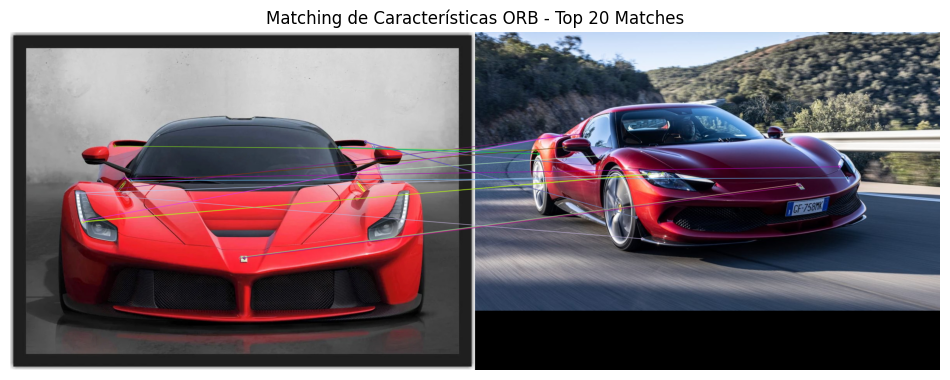

In [5]:
# Suponha que você tenha duas imagens a serem comparadas: img1 e img2
img1 = cv2.imread('imagens/ferrari.jpg')
img2 = cv2.imread('imagens/ferrari2.jpg')

# Converter para escala de cinza
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Criar o detector ORB
orb = cv2.ORB_create()

# Detectar keypoints e descritores
kp1, des1 = orb.detectAndCompute(gray1, None)
kp2, des2 = orb.detectAndCompute(gray2, None)

# Comparar os descritores usando o BFMatcher
bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=True)
matches = bf.match(des1, des2)

# Ordenar os matches pelo menor erro de distância
matches = sorted(matches, key=lambda x: x.distance)

# Desenhar os primeiros 20 matches
img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:20], None, flags=2)

plt.figure(figsize=(12, 6))
plt.imshow(cv2.cvtColor(img_matches, cv2.COLOR_BGR2RGB))
plt.title(f"Matching de Características ORB - Top 20 Matches")
plt.axis('off')
plt.show()

# Comentário explicativo:
# Os descritores extraídos pelo ORB (variáveis des1 e des2) representam as "impressões digitais" das regiões de interesse das imagens.
# Usando um algoritmo de matching, como o BFMatcher, conseguimos comparar essas impressões digitais entre diferentes imagens.
# Quanto mais matches (ou quanto menor a distância dos matches), mais semelhantes são as imagens (ou partes delas).
# Esse processo pode ser aplicado para reconhecer objetos, comparar fotos, rastrear pontos em vídeos, ou até como etapa de pré-processamento para classificação com machine learning.

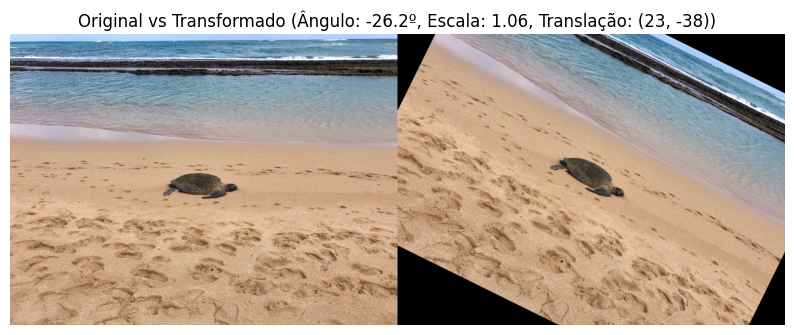

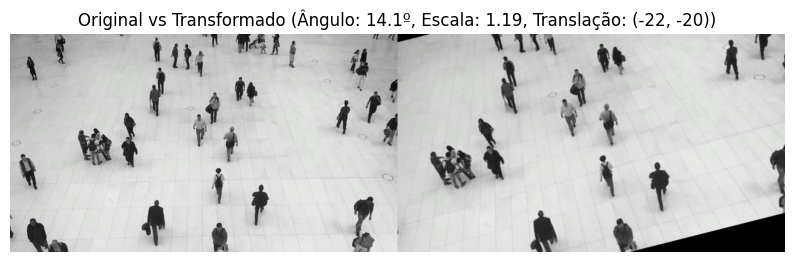

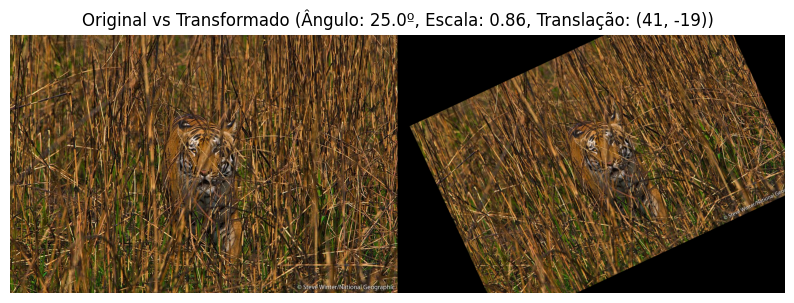

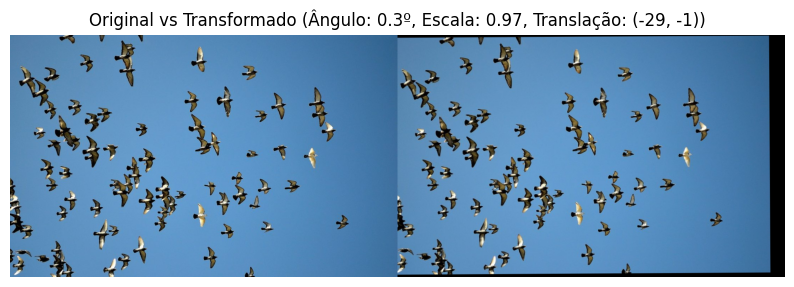

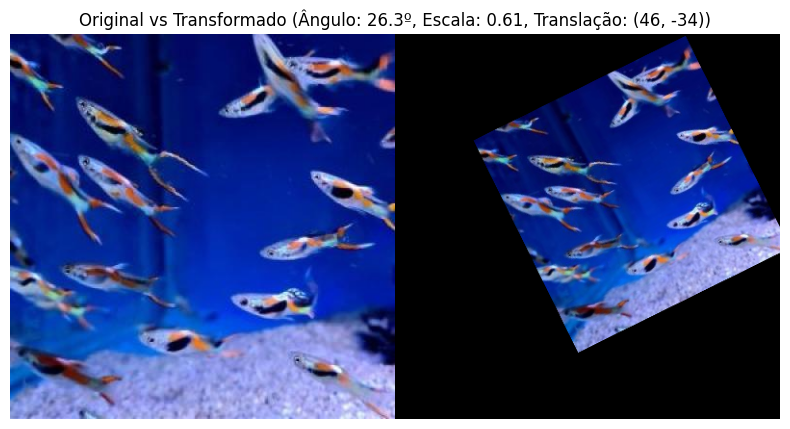

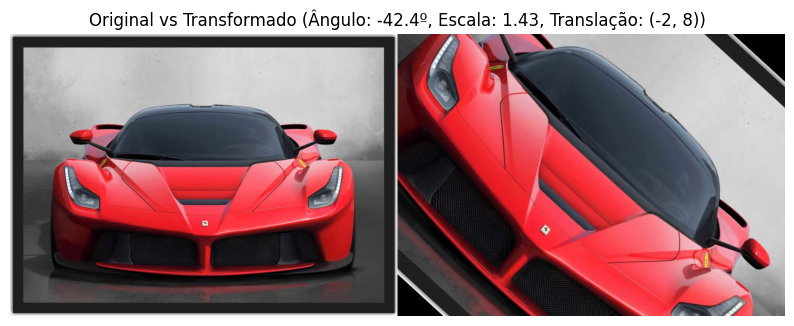

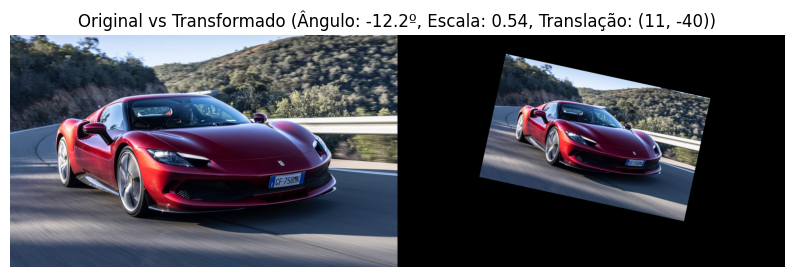

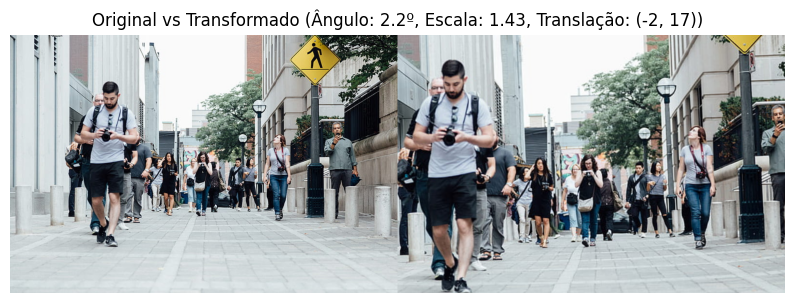

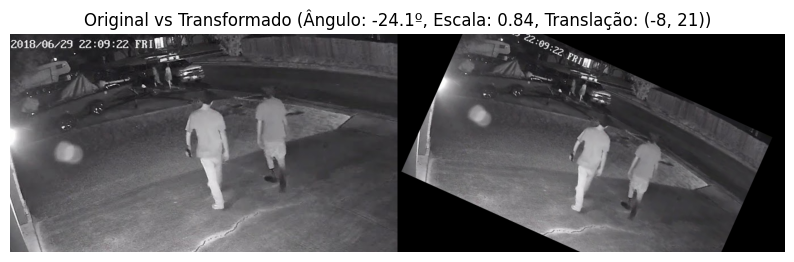

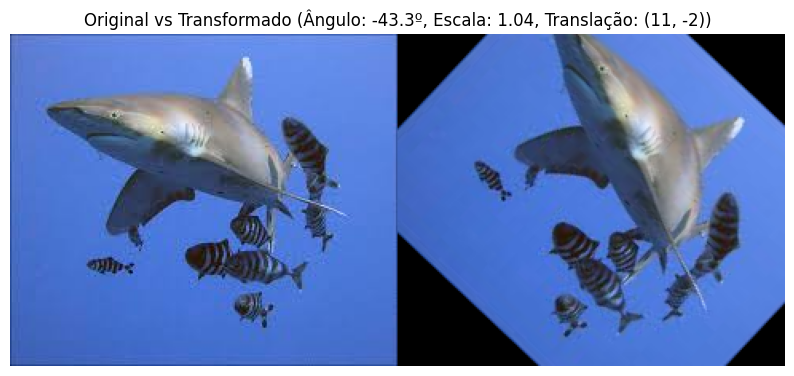

In [6]:
#https://docs.google.com/document/d/1rGOf4__9KqL1c6qpCddTv7Wlt37Ul-QMxCDv5Gt30h0/edit?tab=t.0#heading=h.wsrhulpql4xx - Transformacao, rotacao, etc

import random

for orig in imagens:
    h, w = orig.shape[:2]
    
    # parametros aleatorios
    angle = random.uniform(-45, 45)          # rotação entre -45 e 45 graus
    scale = random.uniform(0.5, 1.5)           # escala entre 0.5 e 1.5
    tx = random.randint(-50, 50)               # Translação horizontal aleatória
    ty = random.randint(-50, 50)               # Translação vertical aleatória
    
    # Criação da matriz de transformação: rotação + escala
    M = cv2.getRotationMatrix2D((w/2, h/2), angle, scale)
    # Adicionar translação à matriz
    M[0, 2] += tx
    M[1, 2] += ty
    
    # Aplicação da transformação
    transformed = cv2.warpAffine(orig, M, (w, h))
    
    # Exibição lado a lado: imagem original vs transformada
    combined = np.hstack((orig, transformed))
    plt.figure(figsize=(10, 5))
    plt.imshow(cv2.cvtColor(combined, cv2.COLOR_BGR2RGB))
    plt.title(f"Original vs Transformado (Ângulo: {angle:.1f}º, Escala: {scale:.2f}, Translação: ({tx}, {ty}))")
    plt.axis('off')

plt.show()